<a href="https://colab.research.google.com/github/austinbennysmith/OSOM-ERDDAP/blob/master/MODIS_VIIRS_Spatial_Averages_Slow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This code **graphs the spatial average** of chlorophyll a, k490, or PAR from the MODIS & VIIRS satellites together against time. It also **maps** any of these three variables from both satellites. You'll need to scroll past a lot of maps to get to the graph at the end. It should work for Monthly, 8 Day, or 1 Day composites, but is extremely slow, and probably not worth using for 8 Day or 1 Day. **In general, it's a better idea to use the "MODIS & VIIRS Faster Comparisons" notebook, but that one will not graph PAR.**

In [ ]:
#First, some installations and imports
!pip install netCDF4
import requests
from netCDF4 import Dataset as NetCDFFile
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
#To use cartopy in a Colab notebook, I need a particular sequence of installs (as shown at this notebook: https://colab.research.google.com/github/adamlamee/CODINGinK12/blob/master/notebooks/quakes.ipynb#scrollTo=3LkZkXvnMAr4)
!apt-get -qq install python-cartopy python3-cartopy;
!pip uninstall -y shapely;
!pip install shapely --no-binary shapely;
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.axes import Axes
from cartopy.mpl.geoaxes import GeoAxes
GeoAxes._pcolormesh_patched = Axes.pcolormesh
import calendar
import datetime

The following code cell defines a function that makes a list of dates and uses conditionals to define some variables that will be used in making the url and labeling the plots. This is the cell where you can change the dates you want to graph.

In [ ]:
#the code dealing with datetime here is based on code at this link: https://stackoverflow.com/questions/1060279/iterating-through-a-range-of-dates-in-python
#This link also helped with datetime stuff: https://stackoverflow.com/questions/5734438/how-to-create-a-month-iterator
import datetime
from datetime import date, timedelta
from datetime import datetime as dt
def conditionals():
  #since this is a function, and I want a bunch of the variables to be referenced outside of the function, I use global below for a bunch of the variables. Otherwise if I try to reference those variables outside of this function, it won't work.
  global dates2
  global myvar
  global title
  global dataset_id
  global tt
  global tres
  global unit
  global means
  global timearray
  global satellite
  dates2 = []
  #Modis dataset IDs: 'erdMH1chla1day', 'erdMH1chla8day', 'erdMH1chlamday', 'erdMH1kd4901day', 'erdMH1kd4908day', 'erdMH1kd490mday', 'erdMH1par01day', 'erdMH1par08day', 'erdMH1par0mday'
  #VIIRS dataset IDs: 'erdVH2018chla8day', 'erdVH2018chla1day', 'erdVH2018chlamday', 'erdVH2018k4908day', 'erdVH2018k4901day', 'erdVH2018k490mday', 'erdVH2018par8day', 'erdVH2018par1day', 'erdVH2018parmday'
  dataset_id = input("What's the dataset ID?") #This code will only handle the chlorophyll, k490, and PAR datasets
  if 'MH' in dataset_id: #this tells whether it's MODIS data
    satellite = 'MODIS'
  elif 'VH' in dataset_id: #this tells whether it's VIIRS data
    satellite = 'Suomi-NPP/VIIRS'
  tres = dataset_id[-4:] #this figures out Monthly vs 8 Day vs 1 Day resolution
  if tres=='8day' and 'MH' in dataset_id:
    tt = '8 Day '
    start_date = date(2003, 1, 5)
    end_date = date(2020, 5, 20) #end_date can be changed as they add to the dataset in the ERDDAP server
    delta = timedelta(days = 8)
    while start_date<=end_date: #creating list of dates
      dates2.append(str(start_date))
      start_date += delta
  elif tres=='8day' and 'VH' in dataset_id:
    tt = '8 Day '
    start_date = date(2012, 1, 5)
    end_date = date(2020, 5, 12)
    delta = timedelta(days = 8)
    while start_date<=end_date: #creating list of dates
      dates2.append(str(start_date))
      start_date += delta
  elif tres=='1day' and 'MH' in dataset_id:
    tt = '1 Day '
    start_date = date(2003, 1, 1)
    end_date = date(2020, 6, 16)
    delta = timedelta(days = 1)
    while start_date<=end_date: #creating a list of dates
      dates2.append(str(start_date))
      start_date += delta
  elif tres=='1day' and 'VH' in dataset_id:
    tt = '1 Day '
    start_date = date(2012, 1, 2)
    end_date = date(2020, 6, 8)
    delta = timedelta(days = 1)
    while start_date<=end_date: #creating a list of dates
      dates2.append(str(start_date))
      start_date += delta
  elif tres=='mday' and 'MH' in dataset_id:
    tt = 'Monthly '
    start_date = date(2003, 1, 16)
    end_date = date(2020, 4, 16)
    def months_iter(start_month, start_year, end_month, end_year): #creating a list of dates
      start_date = datetime.date(start_year, start_month, 1)
      end_date = datetime.date(end_year, end_month, 1)
      date = start_date
      while date <= end_date:
          yield (date.month, date.year)
          new_new = str(datetime.date(date.year, date.month, 16))
          dates2.append(new_new)
          days_in_month = calendar.monthrange(date.year, date.month)[1]
          date += datetime.timedelta(days_in_month)
    def months(start_month, start_year, end_month, end_year):
      return tuple(d for d in months_iter(start_month, start_year, end_month, end_year))
    months(1, 2003, 4, 2020)
  elif tres=='mday' and 'VH' in dataset_id:
    tt = 'Monthly '
    start_date = date(2012, 1, 15)
    end_date = date(2020, 4, 15)
    def months_iter(start_month, start_year, end_month, end_year): #creating a list of dates
      start_date = datetime.date(start_year, start_month, 1)
      end_date = datetime.date(end_year, end_month, 1)
      date = start_date
      while date <= end_date:
          yield (date.month, date.year)
          new_new = str(datetime.date(date.year, date.month, 15))
          dates2.append(new_new)
          days_in_month = calendar.monthrange(date.year, date.month)[1]
          date += datetime.timedelta(days_in_month)
    def months(start_month, start_year, end_month, end_year):
      return tuple(d for d in months_iter(start_month, start_year, end_month, end_year))
    months(1, 2012, 4, 2020)
  #defining some variables to be used in plotting:
  if 'chla' in dataset_id and 'MH' in dataset_id:
    myvar = 'chlorophyll'
    unit = 'mg m^-3'
    title = 'Chlorophyll a '
  elif 'chla' in dataset_id and 'VH' in dataset_id:
    myvar = 'chla'
    unit = 'mg m^-3'
    title = 'Chlorophyll a'
  elif 'kd490' in dataset_id or 'k490' in dataset_id:
    myvar = 'k490'
    unit = 'm^-1'
    title = 'K490 '
  elif 'par' in dataset_id:
    myvar = 'par'
    unit = 'einstein m^-2 day ^-1'
    title = 'Photosynthetically Available Radiation '
  #the following two lists will be used later:
  means = []
  timearray = []

The next cell defines a function that loops through each date and makes a map of the chosen variable. You should run the conditionals() function before running this one.

In [ ]:
def make_url():
  for i in dates2: #looping through each date
    #making a url and opening the dataset:
    url = 'https://pricaimcit.services.brown.edu/erddap/griddap/'+dataset_id+'.nc?'+myvar+'[('+i+'T00:00:00Z):1:('+i+'T00:00:00Z)][(41.5):1:(40.5)][(-72.65):1:(-70.25)]'
    r = requests.get(url, allow_redirects=True)
    open('test.nc', 'wb').write(r.content)
    nc = NetCDFFile('test.nc')
    nc
    #picking out some variables:
    lat = nc.variables['latitude'][:]
    lon = nc.variables['longitude'][:]
    time = nc.variables['time'][:]
    mapvar = nc.variables[myvar][:]
    fig = plt.figure(i, figsize = (10, 10))
    #the following three lines allow me to put coastlines over the data
    ax = plt.axes(projection = ccrs.PlateCarree())
    ax.coastlines(resolution='10m', color = 'red')
    ax.set_extent([287.25, 290.25, 40.5, 42.25]) #I realize these aren't the same coordinate boundaries as the ones I'm using for the data itself, but it's kinda cool to see more of the coastline
    myplot = plt.pcolormesh(lon, lat, mapvar[0,:,:], cmap = 'rainbow') #this probably isn't the best colormap to use
    means.append((np.mean(mapvar))) #taking the spatial average, putting it in the list of means that I'll graph later on
    timearray.append(dt.fromtimestamp(time)) #setting up the time list that I'll need for graphing
    plt.title(title+i)
    cbar = plt.colorbar()
    cbar.set_label(unit, rotation=270) 
    plt.show()

Finally, I execute the conditionals() and make_url() functions each twice, and use the results to make a graph of the variable's spatial average over time. You'll see this graph if you scroll all the way to the bottom, past all the maps.

Note: Throughout this Github, I like to graph MODIS data in cyan and VIIRS data in magenta, for consistency. Some of the notebooks will do this automatically, but this one doesn't. When you run the code cell below, be sure to input a MODIS dataset ID first, and a VIIRS ID second, so that the colors in the graph are correct.

What's the dataset ID?erdMH1par0mday


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in less
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in greater
  del sys.path[0]


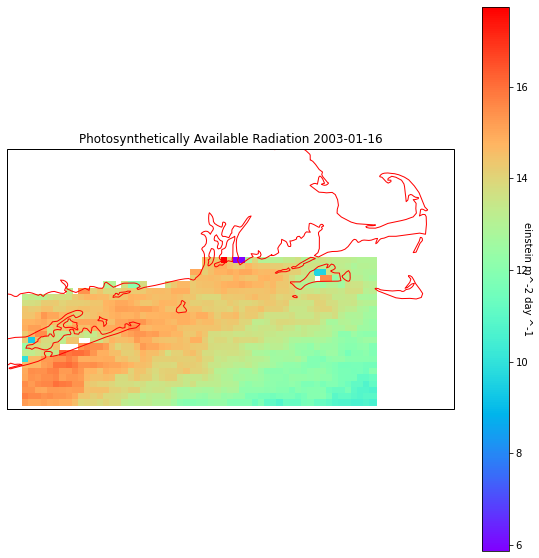

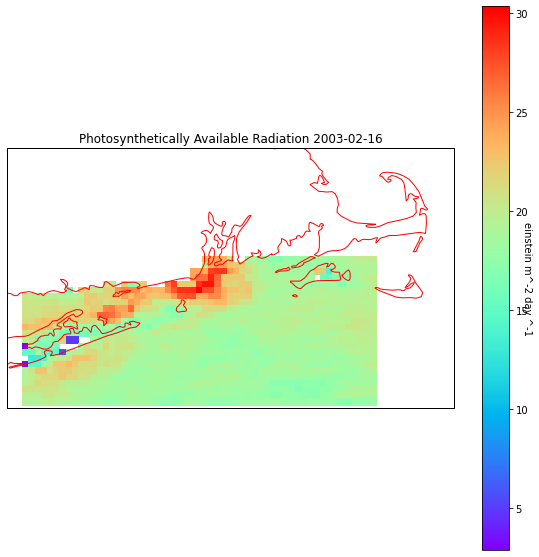

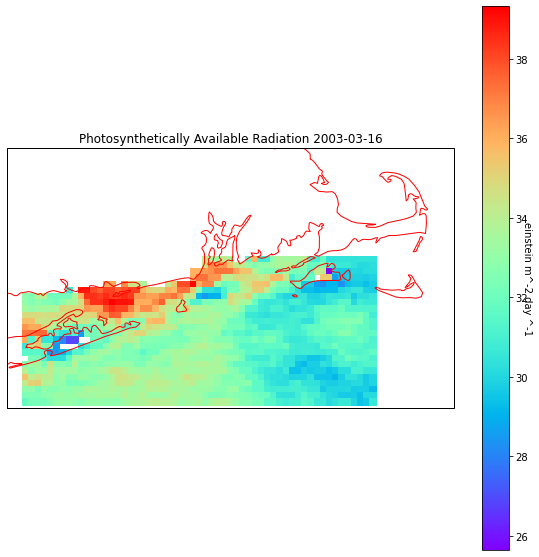

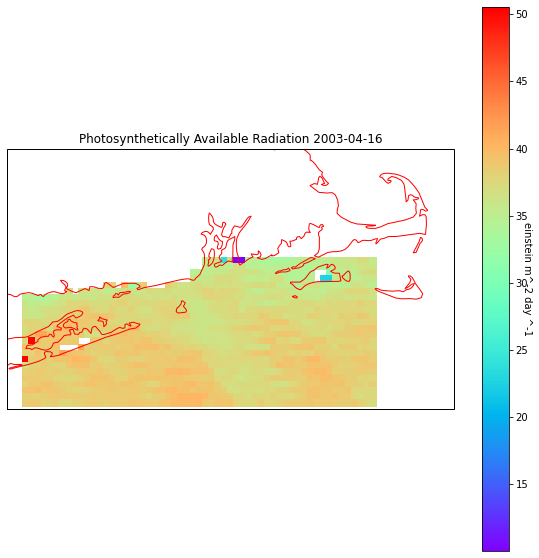

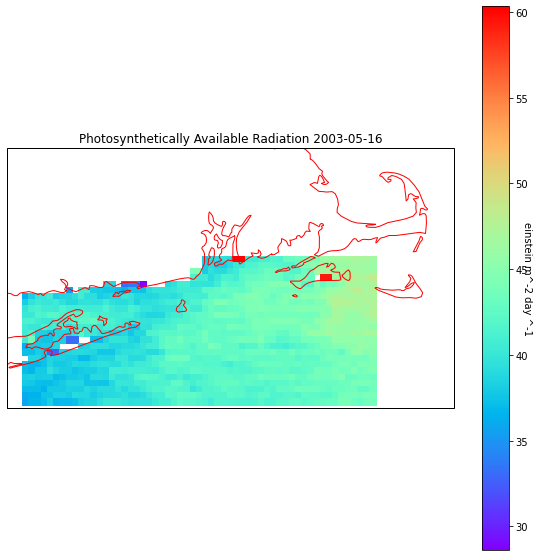

...

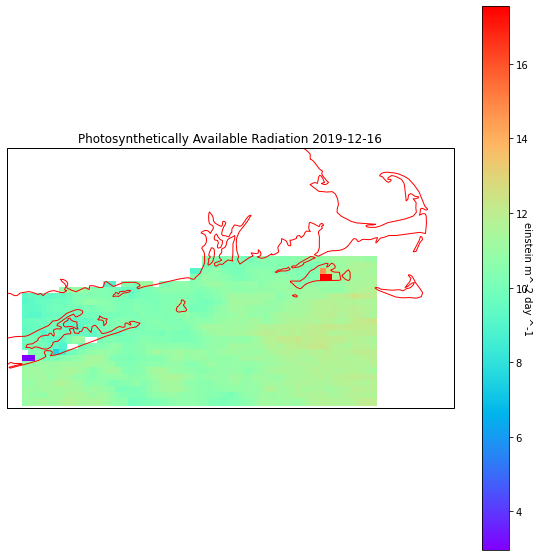

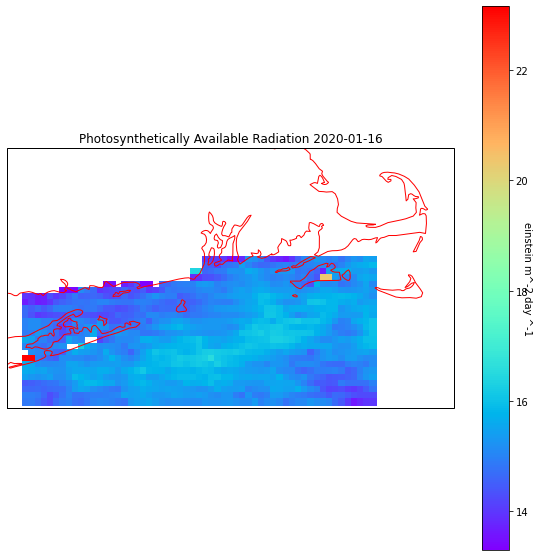

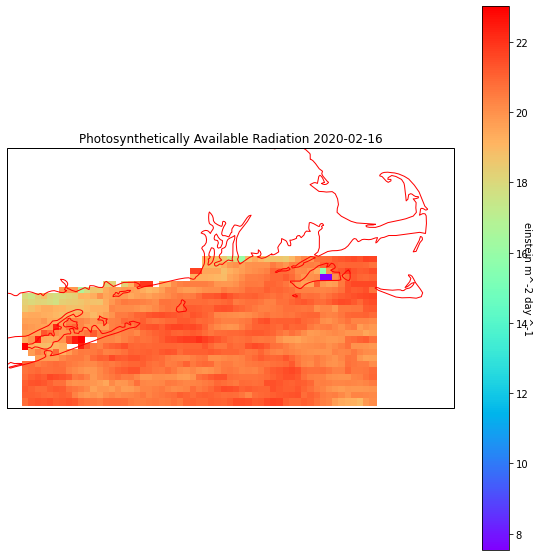

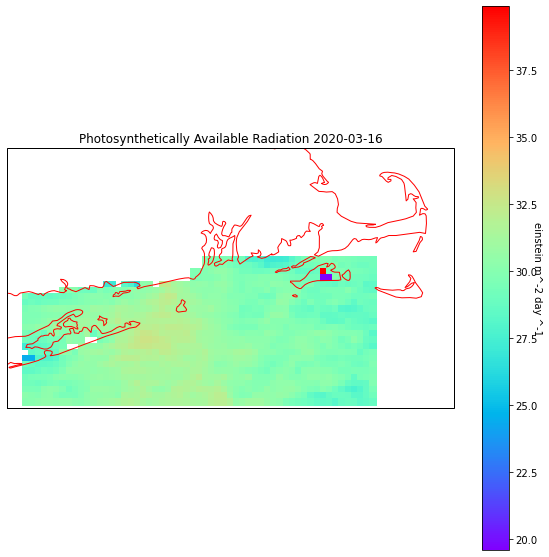

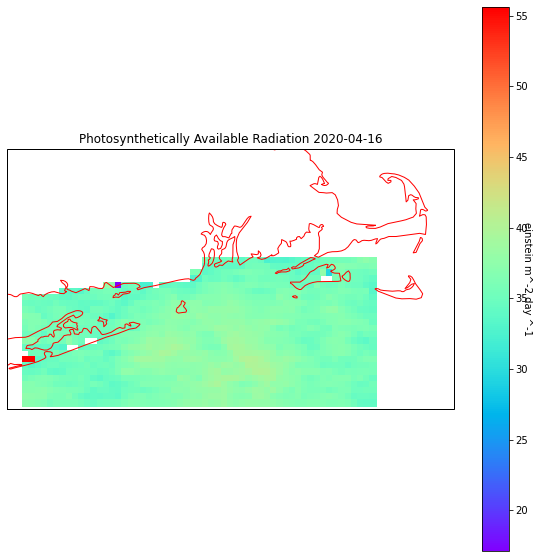

What's the dataset ID?erdVH2018parmday


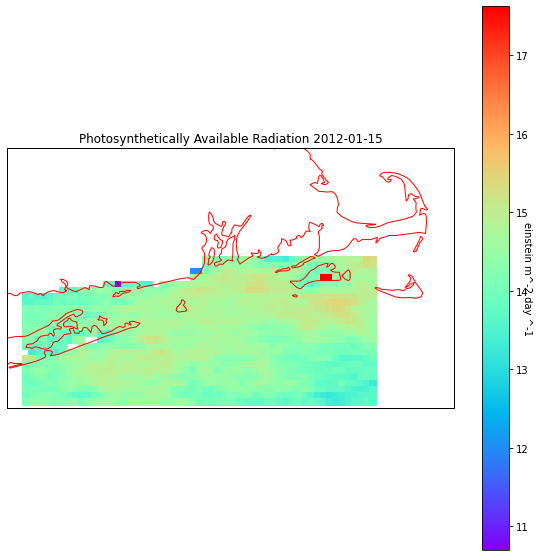

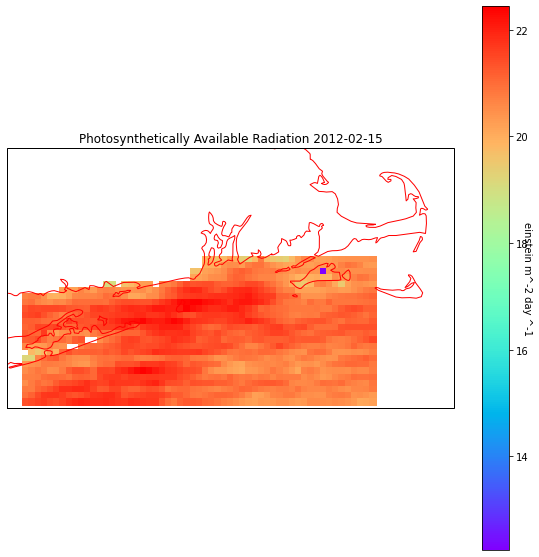

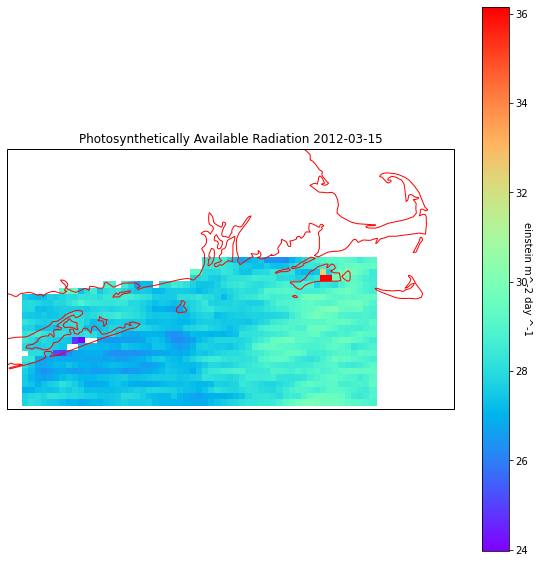

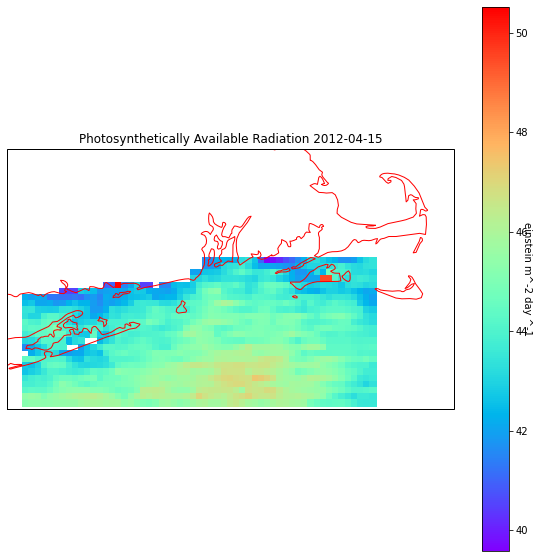

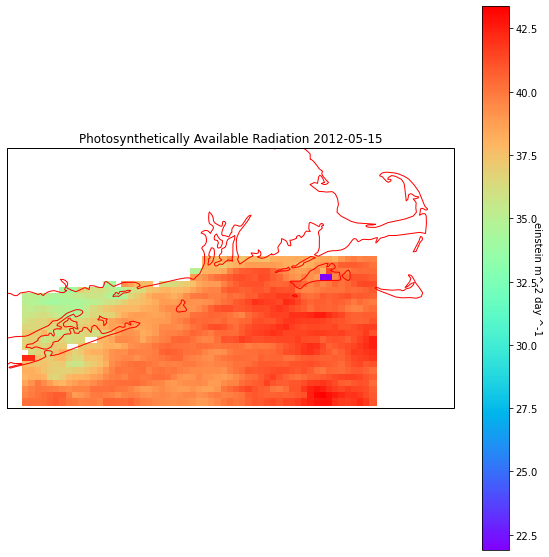

...

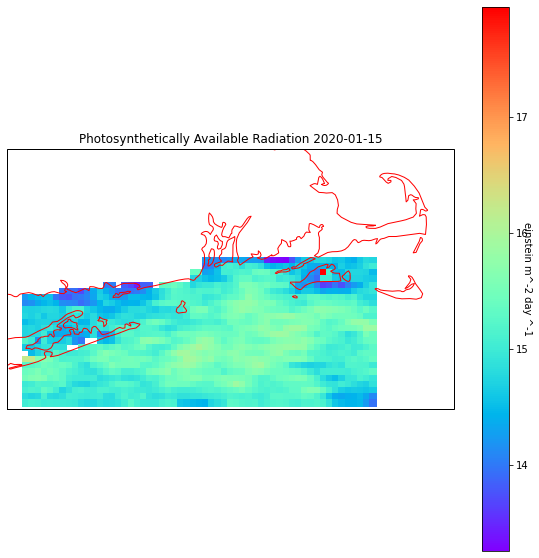

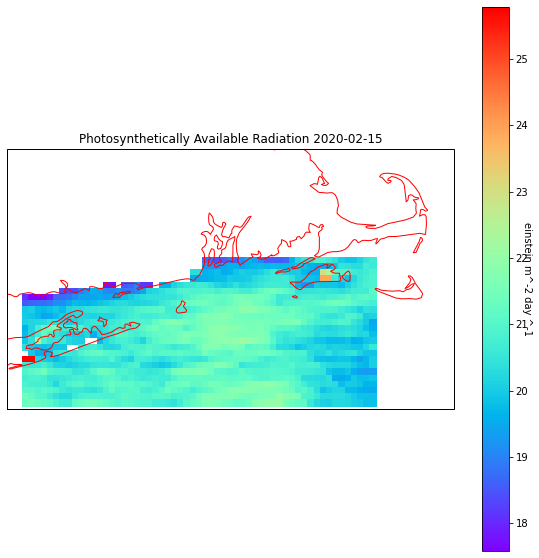

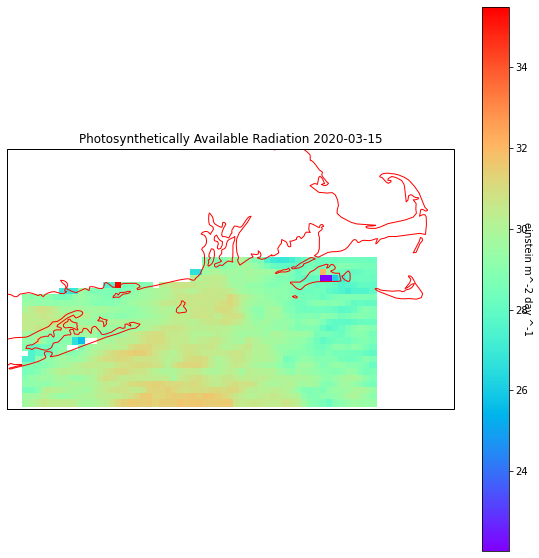

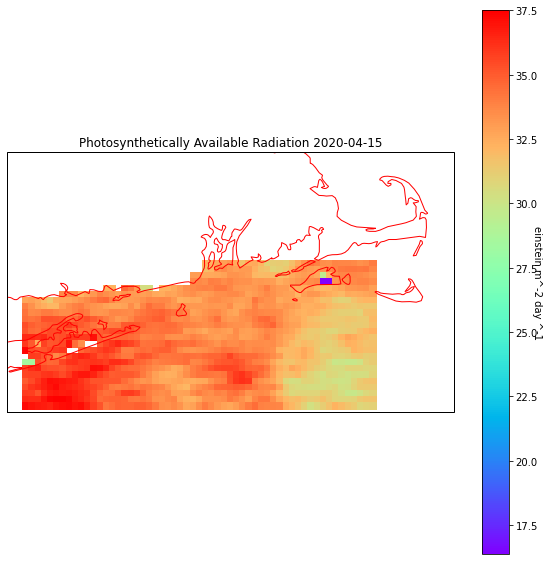

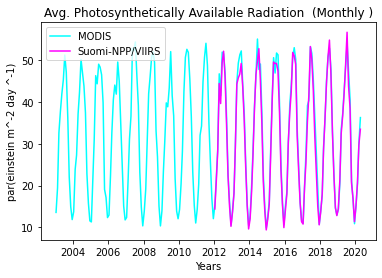

In [ ]:
#from google.colab import drive
#drive.mount('/content/gdrive')
#images_dir = '/content/gdrive/Shared drives/BFK_BOG/SURF_UG/Benny/Images/Phytoplankton_averages/MODIS_VIIRS_Comparisons'
conditionals()
make_url()
#below, I set the variables means2, timearray2, and satellite2, because once I run the two functions again the variables means, timearray, and satellite will be given new values. So I need to store them in separate variables to use them later in plotting.
means2 = means
timearray2 = timearray
satellite2 = satellite
conditionals()
make_url()
means3 = means
timearray3 = timearray
satellite3 = satellite
fig, ax = plt.subplots()
ax.plot(timearray2, means2, label = satellite2, color = 'cyan')
ax.plot(timearray3, means3, label = satellite3, color = 'magenta')
plt.legend(loc="upper left")
plt.xlabel('Years')
plt.ylabel(myvar+'('+unit+')')
plt.title('Avg. '+title+' ('+tt+')')
#plt.savefig(f"{images_dir}/"+tt+myvar+".png")
plt.show()